In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from itertools import combinations
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [ ]:
# Reading data
df = pd.read_csv("Housing.csv")
df.columns

Index(['Unnamed: 0', 'longitude', 'latitude', 'housing_median_age',
       'total_rooms', 'total_bedrooms', 'population', 'households',
       'median_income', 'median_house_value', 'ocean_proximity'],
      dtype='object')

In [ ]:
df = df.drop(columns='Unnamed: 0')

In [ ]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       'median_house_value', 'ocean_proximity'],
      dtype='object')

In [ ]:
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [ ]:
df.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [ ]:
df.isnull().sum()

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [ ]:
# Filling null values
df['total_bedrooms'] = df['total_bedrooms'].fillna(df['total_bedrooms'].median())

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,536.838857,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,419.391878,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,297.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,643.250000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [ ]:
# Histogram
def histogram(x):
  columns_to_plot = [col for col in x.columns]

  columns_per_row = 3
  rows = (len(columns_to_plot) + columns_per_row - 1) // columns_per_row

  fig = make_subplots(rows=rows, cols=columns_per_row, subplot_titles=columns_to_plot)

  for i, column in enumerate(columns_to_plot):
      row = i // columns_per_row + 1
      col = i % columns_per_row + 1
      hist = go.Histogram(x=df[column], name=column)
      fig.add_trace(hist, row=row, col=col)

  fig.update_layout(height=rows*300, width=900, title_text="Histograms of Housing Data Attributes", showlegend=False)
  fig.show()

In [ ]:
histogram(df.drop(columns='ocean_proximity'))

In [ ]:
# Bargraph
def bargraph(y, x):
  counts = y.value_counts()

  fig = px.bar(counts,
             x=counts.index,
             y=counts.values,
             labels={'x': x, 'y': 'Count'},
             title='Counts of Ocean Proximity Categories')

  fig.show()

In [ ]:
bargraph(df["ocean_proximity"], "ocean_proximity")

In [ ]:
# Pair plots
def pair_plot(df):
  sns.pairplot(df)
  plt.show()

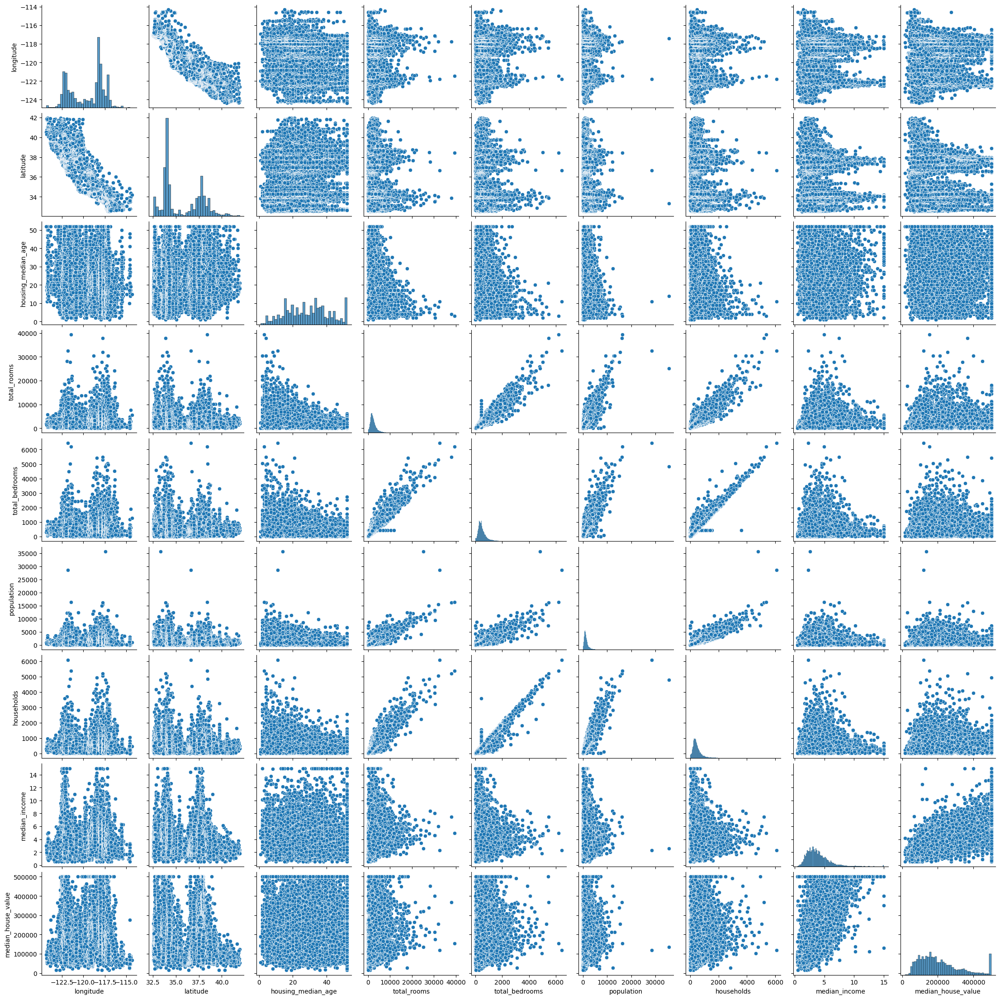

In [ ]:
pair_plot(df)

In [ ]:
# Map
def plot_geo_data_on_map(df):
    fig = px.scatter_mapbox(df,
                            lat="latitude",
                            lon="longitude",
                            color="ocean_proximity",
                            size="median_income",
                            size_max=15,
                            zoom=10,
                            mapbox_style="carto-positron",
                            title="Longitude and Latitude wrt Ocean Proximity",
                            labels={"ocean_proximity": "Ocean Proximity", "median_income": "Median Income"})

    fig.show()


In [ ]:
plot_geo_data_on_map(df)

In [ ]:
# Scatter plot: Total Bedrooms vs. Total Rooms
fig1 = px.scatter(
    df,
    x='total_bedrooms',
    y='total_rooms',
    color='households',
    title='Total Bedrooms vs. Total Rooms',
    labels={
        'total_bedrooms': 'Total Bedrooms',
        'total_rooms': 'Total Rooms',
        'households': 'Households'
    },
    color_continuous_scale=px.colors.sequential.Viridis
)

fig1.show()
fig1.write_html('housing1_map.html')

# Scatter plot: Total Bedrooms vs. Households
fig2 = px.scatter(
    df,
    x='total_bedrooms',
    y='households',
    color='households',
    title='Total Bedrooms vs. Households',
    labels={
        'total_bedrooms': 'Total Bedrooms',
        'households': 'Households'
    },
    color_continuous_scale=px.colors.sequential.Viridis
)

fig2.show()
fig2.write_html('housing2_map.html')

# Scatter plot: Total Rooms vs. Households
fig3 = px.scatter(
    df,
    x='total_rooms',
    y='households',
    color='households',
    title='Total Rooms vs. Households',
    labels={
        'total_rooms': 'Total Rooms',
        'households': 'Households'
    },
    color_continuous_scale=px.colors.sequential.Viridis
)

fig3.show()

In [ ]:
# Box plots
def box_plot(df):
  for column in df.columns:
    fig = px.box(df, y=column, title=f'Box plot of {column}')
    fig.show()

In [ ]:
box_plot(df)

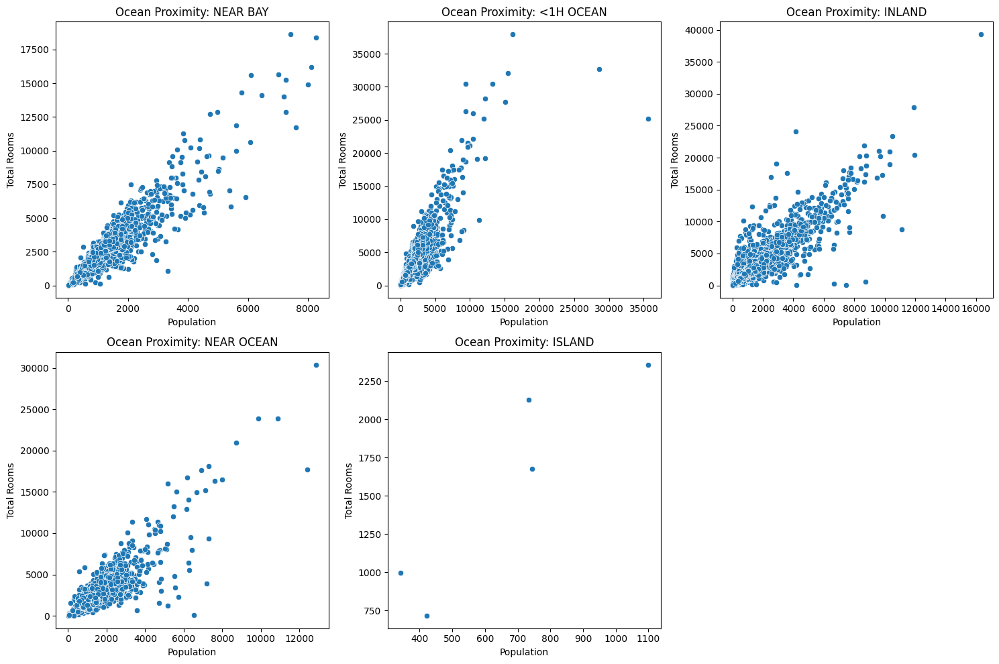

In [ ]:
categories = df['ocean_proximity'].unique()

# Set up the plotting area
plt.figure(figsize=(15, 10))

# Loop through each category and create a subplot
for i, category in enumerate(categories):
    plt.subplot(2, 3, i+1)  # Adjust the grid size if needed
    subset = df[df['ocean_proximity'] == category]
    sns.scatterplot(x='population', y='total_rooms', data=subset)
    plt.title(f'Ocean Proximity: {category}')
    plt.xlabel('Population')
    plt.ylabel('Total Rooms')

plt.tight_layout()
plt.show()

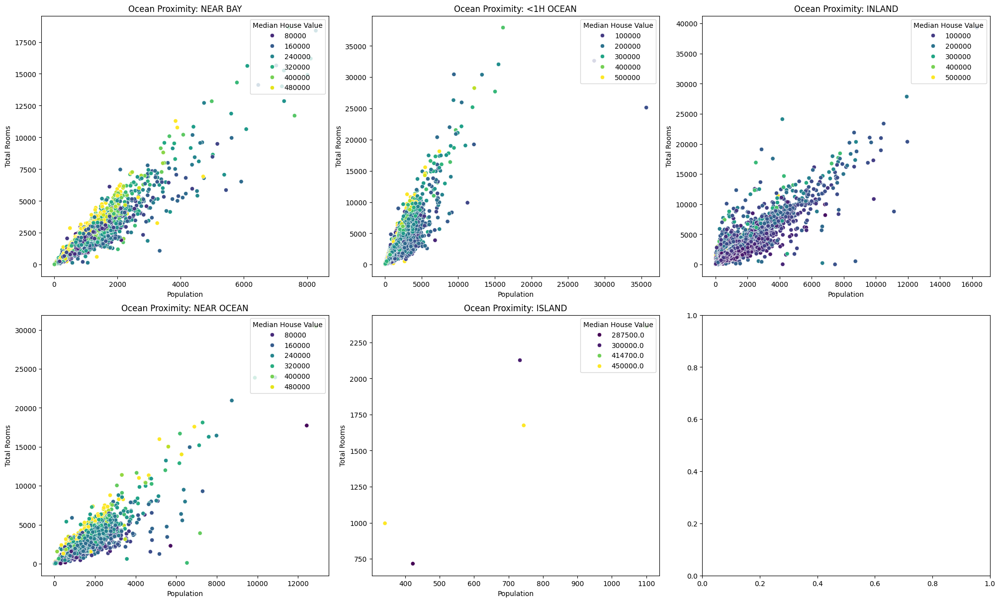

In [ ]:
# Scatter plot of Total Rooms and Population according to Ocean Proximity
categories = df['ocean_proximity'].unique()

fig, axes = plt.subplots(2, 3, figsize=(20, 12), constrained_layout=True)

for i, category in enumerate(categories):
    ax = axes[i // 3, i % 3]
    subset = df[df['ocean_proximity'] == category]
    scatter = sns.scatterplot(x='population', y='total_rooms', hue='median_house_value', palette='viridis', data=subset, ax=ax)
    ax.set_title(f'Ocean Proximity: {category}')
    ax.set_xlabel('Population')
    ax.set_ylabel('Total Rooms')
    scatter.legend(loc='upper right', title='Median House Value')

plt.show()


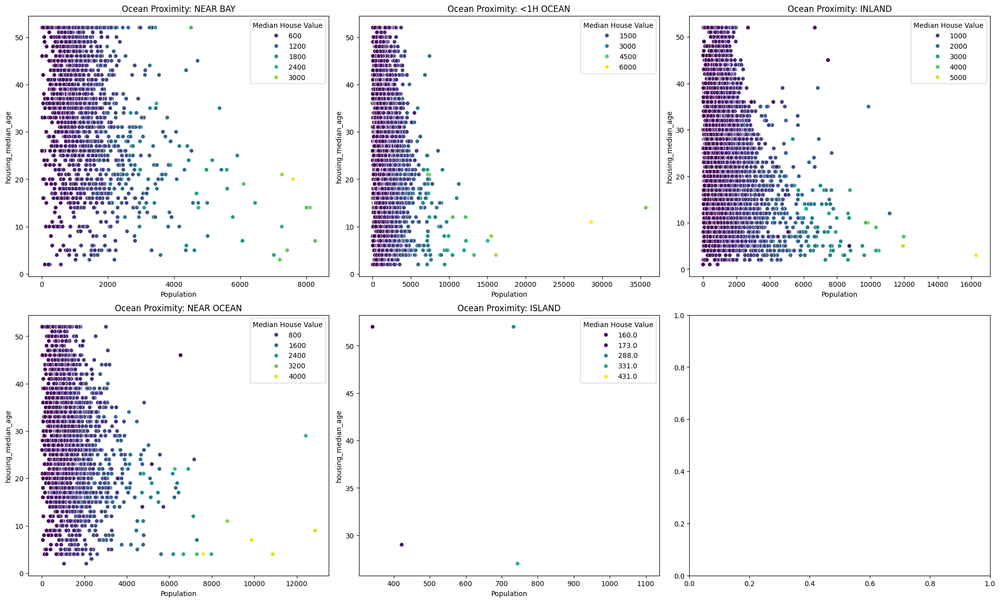

In [ ]:
# Scatter plot of Total Rooms, Population and Median House Value according to Ocean Proximity

categories = df['ocean_proximity'].unique()

fig, axes = plt.subplots(2, 3, figsize=(20, 12), constrained_layout=True)

for i, category in enumerate(categories):
    ax = axes[i // 3, i % 3]
    subset = df[df['ocean_proximity'] == category]
    scatter = sns.scatterplot(x='population', y='housing_median_age', hue='households', palette='viridis', data=subset, ax=ax)
    ax.set_title(f'Ocean Proximity: {category}')
    ax.set_xlabel('Population')
    ax.set_ylabel('housing_median_age')
    scatter.legend(loc='upper right', title='Median House Value')


In [ ]:
# Correlation Matrix
def correlation_matrix(df):
  plt.figure(figsize=(10, 5))
  sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', fmt='.2f')
  plt.title('Correlation Heatmap')
  plt.show()

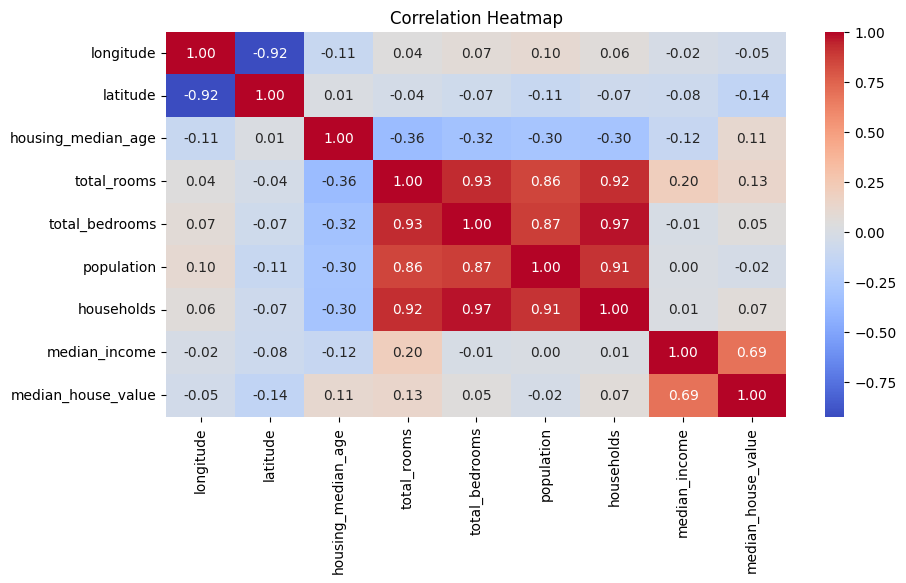

In [ ]:
correlation_matrix(df)

In [ ]:
# Label encoding
from sklearn.preprocessing import LabelEncoder
led = LabelEncoder()
df['ocean_proximity'] =led.fit_transform(df['ocean_proximity'])
df.shape
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,3
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,3
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,3
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,3
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3


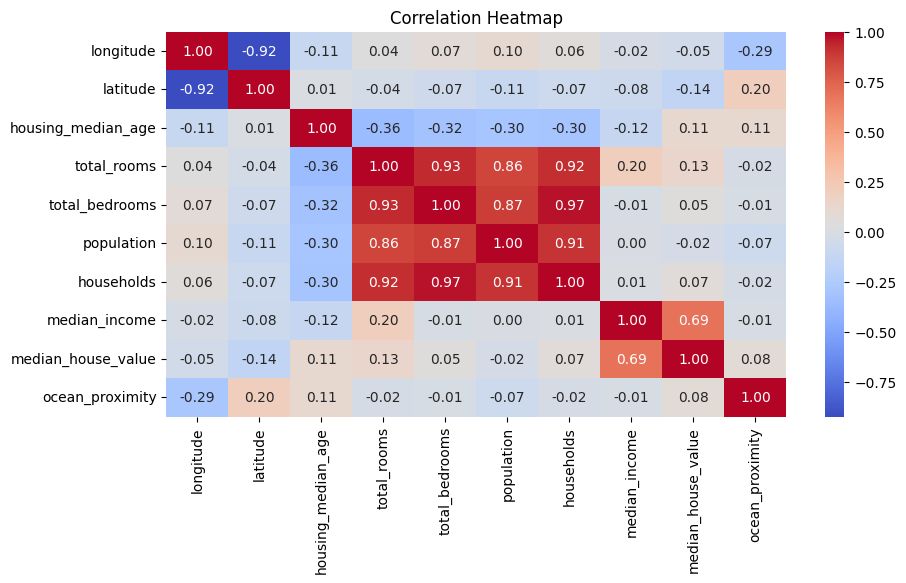

In [ ]:
correlation_matrix(df)

In [ ]:
# Feature engineering
df['rooms_per_household'] = df['total_rooms']/df['households']
df['bedrooms_per_room'] = df['total_bedrooms']/df['total_rooms']
df['population_per_household'] = df['population']/df['households']
columns_to_drop = ['total_rooms', 'total_bedrooms', 'households', 'population']
df = df.drop(columns=columns_to_drop)

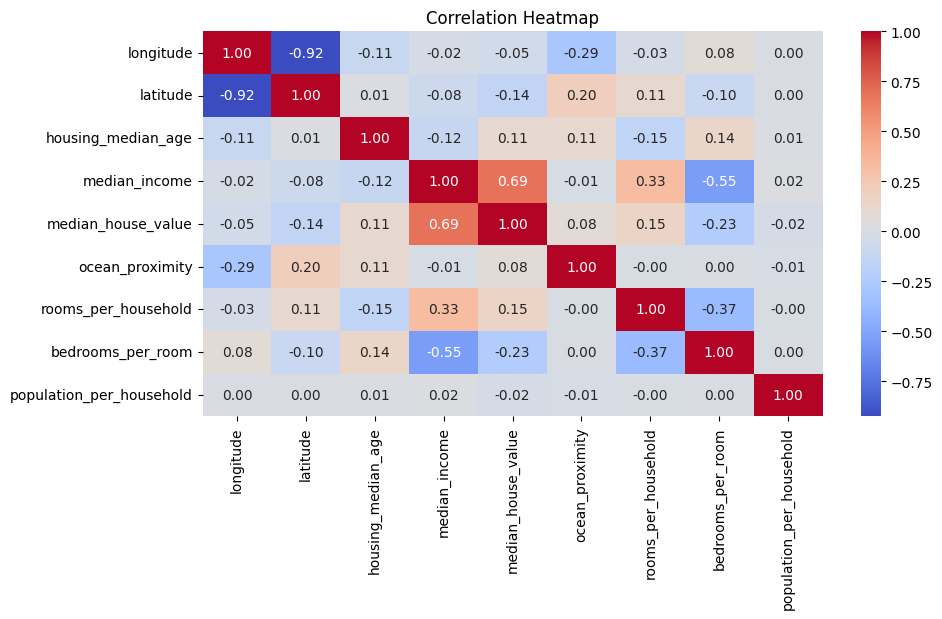

In [ ]:
correlation_matrix(df)

In [ ]:
df.columns

Index(['longitude', 'latitude', 'housing_median_age', 'median_income',
       'median_house_value', 'ocean_proximity', 'rooms_per_household',
       'bedrooms_per_room', 'population_per_household'],
      dtype='object')

In [ ]:
# Removing outliers
columns = ['longitude', 'latitude', 'housing_median_age', 'median_income',
       'median_house_value', 'rooms_per_household',
       'bedrooms_per_room', 'population_per_household']

def remove_outliers(x, columns):
    for col in columns:
        Q1 = x[col].quantile(0.25)
        Q3 = x[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        x = x[(x[col] >= lower_bound) & (x[col] <= upper_bound)]
    return x

In [ ]:
df = remove_outliers(df, columns)

In [ ]:
box_plot(df)

In [ ]:
df['ocean_proximity'].value_counts()

ocean_proximity
0    7533
1    5960
4    2209
3    1922
2       5
Name: count, dtype: int64

In [ ]:
df.shape

(17629, 9)

In [ ]:
X = df.drop(columns='median_house_value')
y = df['median_house_value']

In [ ]:
# Splitting data

from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X, y, random_state= 42, test_size=0.2)

In [ ]:
X_train.shape

(14103, 8)

In [ ]:
X_test.shape

(3526, 8)

In [ ]:
histogram(X_train)

In [ ]:
box_plot(X_train)

In [ ]:
scatter_plot(X_train)

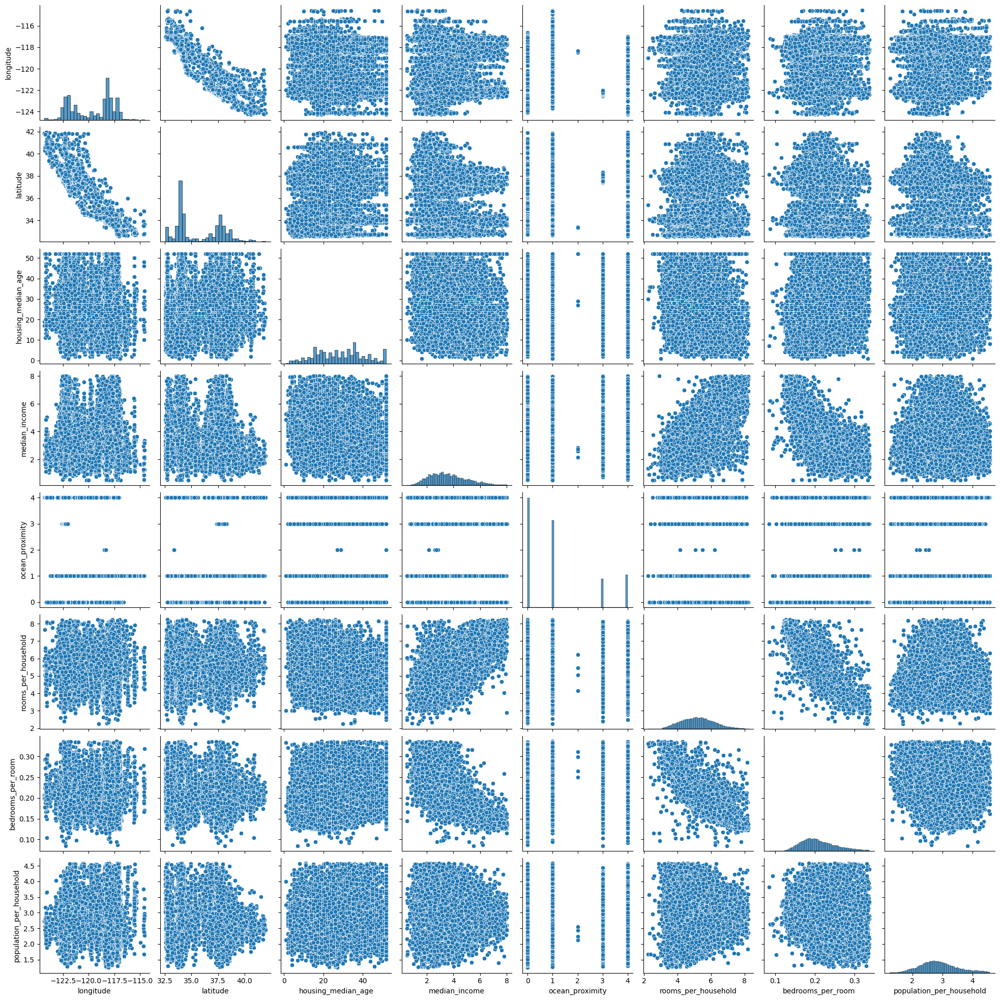

In [ ]:
pair_plot(X_train)

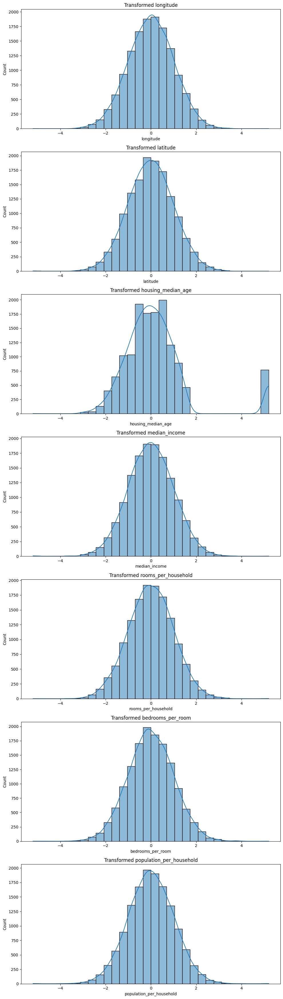

In [ ]:
# Quantile Transformation

from sklearn.preprocessing import QuantileTransformer

def transform_columns(df):
    df_transformed = df.copy()
    n_quantiles = min(df.shape[0], 1000)
    qt = QuantileTransformer(output_distribution='normal', n_quantiles=n_quantiles)
    df_transformed[df.columns] = qt.fit_transform(df[df.columns])
    return df_transformed

def plot_transformed_columns(df):
    num_columns = len(df.columns)
    fig, axes = plt.subplots(nrows=num_columns, ncols=1, figsize=(10, 5 * num_columns))
    for i, col in enumerate(df.columns):
        sns.histplot(df[col], bins=30, kde=True, ax=axes[i])
        axes[i].set_title(f'Transformed {col}')
    plt.tight_layout()
    plt.show()

X_train_transformed = transform_columns(X_train.drop(columns='ocean_proximity'))
plot_transformed_columns(X_train_transformed)

In [ ]:
X_train_transformed.insert(len(X_train_transformed.columns), "ocean_proximity",X_train["ocean_proximity"], True)

In [ ]:
X_test_transformed = transform_columns(X_test.drop(columns='ocean_proximity'))

In [ ]:
X_test_transformed.insert(len(X_test_transformed.columns), "ocean_proximity",X_test["ocean_proximity"], True)

In [ ]:
# Scaling
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
continuous_columns = ['longitude', 'latitude', 'housing_median_age',
 'rooms_per_household', 'bedrooms_per_room',
       'population_per_household']
X_train_transformed[continuous_columns] = scaler.fit_transform(X_train_transformed[continuous_columns])
X_test_transformed[continuous_columns] = scaler.fit_transform(X_test_transformed[continuous_columns])

In [ ]:
#Lasso Regression
from sklearn.metrics import r2_score
from sklearn.linear_model import Lasso
from sklearn.preprocessing import PolynomialFeatures

degree = 3
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train_transformed)
X_test_poly = poly_features.transform(X_test_transformed)


lasso_reg = Lasso(alpha=10.0,max_iter = 100)
lasso_reg.fit(X_train_poly, y_train)
y_train_pred = lasso_reg.predict(X_train_poly)
y_test_pred = lasso_reg.predict(X_test_poly)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print("Train R^2 Score:",train_r2)
print("Test R^2 Score:",test_r2)
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')

Train R^2 Score: 0.7264722718392349
Test R^2 Score: 0.7064107605128291
MAE:  34927.853155265686
MSE:  2445211977.9823194
RMSE:  49449.084703180495
MAPE:  21.691317051674627 %


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:631: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.609e+13, tolerance: 1.195e+10
  model = cd_fast.enet_coordinate_descent(


In [ ]:
#Ridge Regression
from sklearn.metrics import r2_score
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures

degree = 2
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train_transformed)
X_test_poly = poly_features.transform(X_test_transformed)

ridge_reg = Ridge(alpha=10.0, max_iter=10)
ridge_reg.fit(X_train_poly, y_train)
y_train_pred = ridge_reg.predict(X_train_poly)
y_test_pred = ridge_reg.predict(X_test_poly)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')


Train R^2 Score: 0.6917202878105682
Test R^2 Score: 0.702304339520192
MAE:  36462.99134485045
MSE:  2479413060.4721737
RMSE:  49793.70502856936
MAPE:  22.92737863425085 %


In [ ]:
#ElasticNet
from sklearn.metrics import r2_score
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import PolynomialFeatures

degree = 3
poly_features = PolynomialFeatures(degree=degree)
X_train_poly = poly_features.fit_transform(X_train_transformed)
X_test_poly = poly_features.transform(X_test_transformed)

elastic_net_reg = ElasticNet(alpha=10.0, l1_ratio=0.5, max_iter=1000)
elastic_net_reg.fit(X_train_poly, y_train)
y_train_pred = elastic_net_reg.predict(X_train_poly)
y_test_pred = elastic_net_reg.predict(X_test_poly)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')


Train R^2 Score: 0.47547795799206416
Test R^2 Score: 0.47203398134886676
MAE:  50598.90265171763
MSE:  4397262089.811028
RMSE:  66311.85482107273
MAPE:  35.31084090070827 %


In [ ]:
#Linear Regression
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

linear_regression = LinearRegression()
linear_regression.fit(X_train_transformed, y_train)
y_train_pred = linear_regression.predict(X_train_transformed)
y_test_pred = linear_regression.predict(X_test_transformed)
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)
print("Train R^2 Score:",train_r2)
print("Test R^2 Score:",test_r2)
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')

Train R^2 Score: 0.5986136445368533
Test R^2 Score: 0.609389704231056
MAE:  43686.989155564275
MSE:  3253269689.3312907
RMSE:  57037.44111836795
MAPE:  29.1050464900402 %


In [ ]:
# Random Forest Regressor

from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.ensemble import RandomForestRegressor

final_model = RandomForestRegressor(n_estimators = 30)
final_model.fit(X_train_transformed, y_train)
y_pred_test = final_model.predict(X_test_transformed)
y_pred_train = final_model.predict(X_train_transformed)
r2_test = r2_score(y_test, y_pred_test)
r2_train = r2_score(y_train, y_pred_train)
print('R^2 (Test):', r2_test)
print('R^2 (Train):', r2_train)
mae = mean_absolute_error(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_pred_test) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')


R^2 (Test): 0.7891552820068057
R^2 (Train): 0.966833590584193
MAE:  29171.27838910947
MSE:  1756059012.35284
RMSE:  41905.357800081365
MAPE:  17.07177558086323 %


In [ ]:
# SVM

from sklearn.svm import SVR
from sklearn.metrics import r2_score

svr_regression = SVR(kernel = 'poly', C = 2000, gamma = 1)

svr_regression.fit(X_train_transformed, y_train)

y_train_pred = svr_regression.predict(X_train_transformed)
y_test_pred = svr_regression.predict(X_test_transformed)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')


Train R^2 Score: 0.5492281931691556
Test R^2 Score: 0.5567858109960366
MAE:  44374.549190355494
MSE:  3691390889.0436964
RMSE:  60756.81763426798
MAPE:  30.308607316186702 %


In [ ]:
# Hyperparameter tuning in Random Forest Regressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score

param_grid = [
    {'n_estimators': [3, 10, 30], 'max_features': [2, 4, 6, 8]},
    {'bootstrap': [False], 'n_estimators': [3, 10], 'max_features': [2, 3, 4]},
]

forest_reg = RandomForestRegressor()

grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_transformed, y_train)

best_params = grid_search.best_params_

best_forest_reg = RandomForestRegressor(**best_params)
best_forest_reg.fit(X_train_transformed, y_train)

y_train_pred = best_forest_reg.predict(X_train_transformed)
y_test_pred = best_forest_reg.predict(X_test_transformed)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)

mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')


Train R^2 Score: 0.9689109055548123
Test R^2 Score: 0.7967120274171691
MAE:  29216.191425600304
MSE:  1693121268.366516
RMSE:  41147.55482852555
MAPE:  17.390858794217298 %


Feature Importances:
                    feature  importance
3             median_income    0.445582
6  population_per_household    0.139424
0                 longitude    0.097777
7           ocean_proximity    0.093820
1                  latitude    0.090890
2        housing_median_age    0.053303
5         bedrooms_per_room    0.043262
4       rooms_per_household    0.035941


<ipython-input-59-1b10333cca76>:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




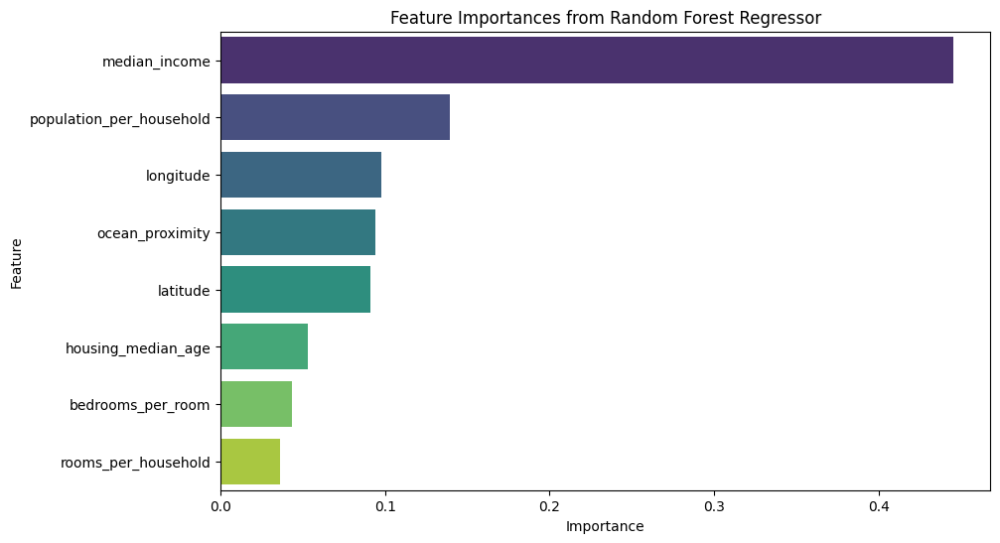

In [ ]:
# Feature importance in Random Forest Regressor
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns

reg = RandomForestRegressor(n_estimators=100, random_state=42)
reg.fit(X_train_transformed, y_train)

feature_importances = reg.feature_importances_

feature_importance_df = pd.DataFrame({
    'feature': X_train_transformed.columns,
    'importance': feature_importances
})

feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

print("Feature Importances:")
print(feature_importance_df)

plt.figure(figsize=(10, 6))
sns.barplot(x='importance', y='feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importances from Random Forest Regressor')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


In [ ]:
x_train = X_train_transformed.drop(columns = ["rooms_per_household"])
x_test = X_test_transformed.drop(columns = ["rooms_per_household"])

In [ ]:
reg.fit(x_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
y_train_pred = reg.predict(x_train)
print(r2_score(y_train, y_train_pred))

0.9706700253406206


In [ ]:
y_test_pred = reg.predict(x_test)
print(r2_score(y_test, y_test_pred))

0.7689663654971667


In [ ]:
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')

MAE:  31181.503417470223
MSE:  1924206116.6475518
RMSE:  43865.773863543676
MAPE:  18.584593452894175 %


                    Feature  Importance
7  population_per_household    0.343770
3             median_income    0.334713
6         bedrooms_per_room    0.097996
1                  latitude    0.066960
0                 longitude    0.062863
2        housing_median_age    0.039400
5       rooms_per_household    0.034425
4           ocean_proximity    0.019872


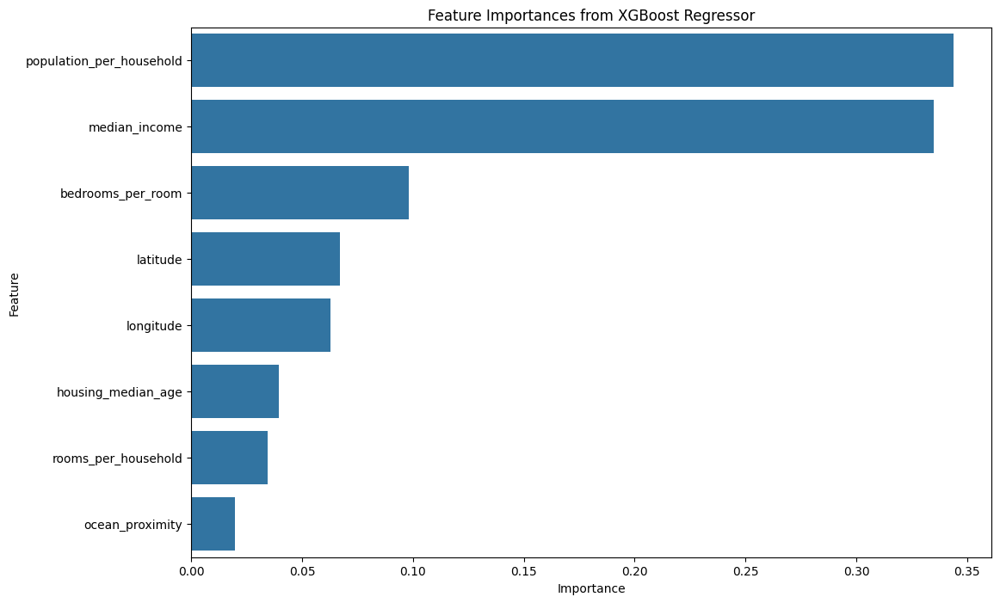

In [ ]:
# Feature importance in XGB Regressor
import pandas as pd
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import seaborn as sns

xgb_reg = XGBRegressor(n_estimators=100, random_state=42)

xgb_reg.fit(X_train_transformed, y_train)

feature_importances = xgb_reg.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print(feature_importance_df)

plt.figure(figsize=(12, 8))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
plt.title('Feature Importances from XGBoost Regressor')
plt.show()


In [ ]:
x_train = X_train_transformed.drop(columns = ["ocean_proximity"])
x_test = X_test_transformed.drop(columns = ["ocean_proximity"])

In [ ]:
xgb_reg.fit(x_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=None,
             num_parallel_tree=None, random_state=42, ...)

In [ ]:
y_train_pred = xgb_reg.predict(x_train)
print(r2_score(y_train, y_train_pred))

0.9344641752608842


In [ ]:
y_test_pred = xgb_reg.predict(x_test)
print(r2_score(y_test, y_test_pred))

0.7446889877522802


In [ ]:
mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ',mae)
print('MSE: ',mse)
print('RMSE: ',rmse)
print('MAPE: ',mape,'%')

MAE:  32646.70717083806
MSE:  2126404722.2895405
RMSE:  46112.95612178361
MAPE:  19.803785019368753 %


In [ ]:
# Hyperparameter tuning in Decision Tree Regressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

param_grid = {
    'max_depth': [None, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

tree_reg = DecisionTreeRegressor()

grid_search = GridSearchCV(tree_reg, param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_transformed, y_train)

best_params = grid_search.best_params_

best_tree_reg = DecisionTreeRegressor(**best_params)
best_tree_reg.fit(X_train_transformed, y_train)

y_train_pred = best_tree_reg.predict(X_train_transformed)
y_test_pred = best_tree_reg.predict(X_test_transformed)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)

mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
print('MAE: ', mae)
print('MSE: ', mse)
print('RMSE: ', rmse)
print('MAPE: ', mape, '%')


Train R^2 Score: 0.7984612629630495
Test R^2 Score: 0.6650204843728332
MAE:  37686.56245589656
MSE:  2789938505.311112
RMSE:  52819.868471164446
MAPE:  22.074544164859788 %


In [ ]:
pip install catboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 5.5 MB/s eta 0:00:00


In [ ]:
# Cat Boost Regressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

best_catboost_reg = CatBoostRegressor(verbose=0, l2_leaf_reg = 1, border_count = 128, learning_rate = 0.1, iterations = 150, depth = 10)
best_catboost_reg.fit(X_train_transformed, y_train)

y_train_pred = best_catboost_reg.predict(X_train_transformed)
y_test_pred = best_catboost_reg.predict(X_test_transformed)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)

mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100

print('MAE: ', mae)
print('MSE: ', mse)
print('RMSE: ', rmse)
print('MAPE: ', mape, '%')


Train R^2 Score: 0.8886731004680597
Test R^2 Score: 0.816199772607628
MAE:  27580.462791769165
MSE:  1530813998.3629785
RMSE:  39125.618185058476
MAPE:  16.16644078199331 %


In [ ]:
# MLP Regressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from scipy.stats import uniform, randint
import numpy as np


best_mlp_reg = MLPRegressor(hidden_layer_sizes=(100,50,50), learning_rate='adaptive', learning_rate_init= 0.01, max_iter=2000, activation = 'relu', solver = 'adam')
best_mlp_reg.fit(X_train_transformed, y_train)

y_train_pred = best_mlp_reg.predict(X_train_transformed)
y_test_pred = best_mlp_reg.predict(X_test_transformed)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)

mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100

print('MAE: ', mae)
print('MSE: ', mse)
print('RMSE: ', rmse)
print('MAPE: ', mape, '%')


Train R^2 Score: 0.8106356708874617
Test R^2 Score: 0.7749780897553973
MAE:  31007.7690407187
MSE:  1874136365.4869518
RMSE:  43291.29664825196
MAPE:  18.814403047704843 %


In [ ]:
# Cat Boost Regressor
from catboost import CatBoostRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

best_catboost_reg = CatBoostRegressor(verbose=0, l2_leaf_reg = 1, border_count = 128, learning_rate = 0.1, iterations = 200, depth = 10)
best_catboost_reg.fit(X_train_transformed, y_train)

y_train_pred = best_catboost_reg.predict(X_train_transformed)
y_test_pred = best_catboost_reg.predict(X_test_transformed)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train R^2 Score:", train_r2)
print("Test R^2 Score:", test_r2)

mae = mean_absolute_error(y_test, y_test_pred)
mse = mean_squared_error(y_test, y_test_pred)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100

print('MAE: ', mae)
print('MSE: ', mse)
print('RMSE: ', rmse)
print('MAPE: ', mape, '%')


Train R^2 Score: 0.9083051081591701
Test R^2 Score: 0.8168199858761465
MAE:  27377.373596551275
MSE:  1525648438.0865388
RMSE:  39059.54989610785
MAPE:  16.063009053625713 %
